In [23]:
import pandas as pd
from sklearn.cluster import KMeans
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import  cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import sklearn.tree as tree
from copy import deepcopy
from analyze_tools import *

In [24]:
df = pd.read_csv('../data/clean_game_data.csv', index_col=0).drop(columns=['Year', 'Game ID'])
df['Victory'] = df['Victory'].astype(int)
top_df = deepcopy(df[df['Role'] == 'TOP'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
mid_df = deepcopy(df[df['Role'] == 'MID'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
jg_df =  deepcopy(df[df['Role'] == 'JUNGLE'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
adc_df =  deepcopy(df[df['Role'] == 'ADC'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])
sup_df = deepcopy(df[df['Role'] == 'SUPPORT'].select_dtypes(include='number')).astype('float64').drop(columns=['Victory'])

scaler = StandardScaler()
top_df[:] = scaler.fit_transform(top_df)
mid_df[:] = scaler.fit_transform(mid_df)
jg_df[:] = scaler.fit_transform(jg_df)
adc_df[:] = scaler.fit_transform(adc_df)
sup_df[:] = scaler.fit_transform(sup_df)

In [25]:
top_df.head()

,Game Duration,Kills,Deaths,Assists,KDA,CS,CS in Team's Jungle,CSM,Golds,GPM,...,Quadra kills,Penta kills,GD@15,CSD@15,XPD@15,LVLD@15,Damage dealt to turrets,Total heal,Time ccing others,Total damage taken
Column,,,,,,,,,,,,,,,,,,,,,
0,-0.375376,-0.673683,0.728690,-1.090205,-0.897729,-0.081957,0.091247,0.363202,-0.560825,-0.437421,...,-0.058179,-0.029053,-0.232458,-1.452545,-0.081570,0.000000,-0.861477,0.303681,-0.466018,0.393305
5,-0.375376,1.218555,-0.371915,-0.224913,0.076837,1.815742,2.445007,3.482362,1.294666,2.619702,...,-0.058179,-0.029053,0.232458,1.452545,0.081570,0.000000,0.894542,-0.449329,0.118999,-0.654925
0,-0.473413,-1.146743,1.829295,-1.090205,-0.970821,-1.424669,0.788658,-1.775650,-1.619939,-2.100066,...,-0.058179,-0.029053,-1.525807,-2.081982,-1.344627,-1.284645,-1.166926,0.075455,-0.206010,0.125873
5,-0.473413,1.218555,-0.922218,0.351949,1.660507,0.473030,1.834773,1.432628,0.674749,1.761562,...,-0.058179,-0.029053,1.525807,2.081982,1.344627,1.284645,1.630082,0.507130,-0.921030,-0.053176
0,-1.193912,-1.146743,1.829295,-0.513344,-0.897729,-1.066613,-0.954868,-0.171511,-1.252817,-0.616200,...,-0.058179,-0.029053,-0.319511,0.000000,-1.310215,-1.284645,-0.997162,-1.040123,-0.271012,-1.144396


In [26]:
pca3_mid = PCA(n_components=3)
pca3_top = PCA(n_components=3)
pca3_jg = PCA(n_components=3)
pca3_adc = PCA(n_components=3)
pca3_sup = PCA(n_components=3)

pca3_mid_df = pd.DataFrame(pca3_mid.fit_transform(mid_df), columns=['PC1', 'PC2', 'PC3'])
pca3_top_df = pd.DataFrame(pca3_top.fit_transform(top_df), columns=['PC1', 'PC2', 'PC3'])
pca3_jg_df = pd.DataFrame(pca3_jg.fit_transform(jg_df), columns=['PC1', 'PC2', 'PC3'])
pca3_adc_df = pd.DataFrame(pca3_adc.fit_transform(adc_df), columns=['PC1', 'PC2', 'PC3'])
pca3_sup_df = pd.DataFrame(pca3_sup.fit_transform(sup_df), columns=['PC1', 'PC2', 'PC3'])

In [27]:
pca3_top_df

,PC1,PC2,PC3
0,-2.609218,0.155474,-1.876049
1,4.586381,-5.104946,-1.782308
2,-5.358920,0.858955,0.628496
3,4.601773,-4.057290,0.162660
4,-3.592469,0.142523,-0.424441
...,...,...,...
9481,1.721098,-0.549862,-1.254073
9482,1.224205,5.304089,0.570263
9483,0.040456,3.069752,-0.705662
9484,1.068193,0.244546,1.296444


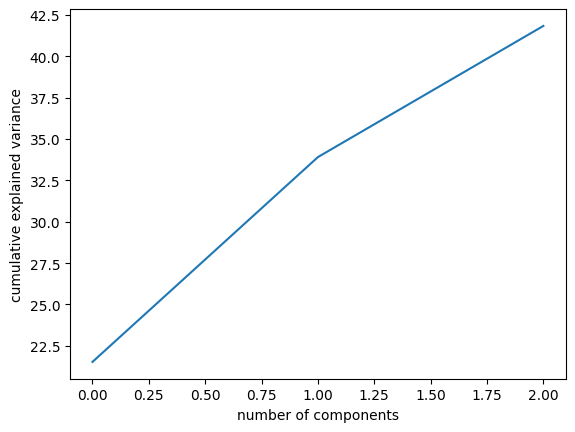

In [28]:
# Top

# cumulated explained variance

explained_variance = pca3_top.explained_variance_ratio_
explained_variance_cum = np.cumsum(explained_variance) * 100
plt.plot(explained_variance_cum)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

n_clusters = 4

cluster_colors = ['red', 'blue', 'green', 'purple']  # Add more colors if needed

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
pred = kmeans.fit_predict(pca3_top_df)

pred_str = [str(p) for p in pred]

px.scatter(pca3_top_df, x='PC1', y='PC2', color=pred_str).show()
show_pca_correlation_circle(pca3_top, top_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_top_df, x='PC1', y='PC3', color=pred_str).show()
show_pca_correlation_circle(pca3_top, top_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_top_df, x='PC1', y='PC2', z='PC3', color=pred_str).show()

Tried Kmeans for 4 toplaner profiles

PC1 :
- Axis looks like it prioritize stats that would help increase the amount of gold held in the long run or be the expression of the latter.
- Deaths does not increase gold = negative
- Others stats are more or less useful, ranging from low link (wards, time cc-ing, IE indirect) to direct cause or consequence (Kills, CS, Gold held which is the highest)

PC2 :
- negative = confrontational, aggressive (kills, CS farm and differential @15 to enemy)
- positive = supportive (wards)

PC3 :
- harder to recognize
- Negative = differential stats, ressource intensive stats (farm), scaling
- Positive = Direct impact on the map and kills / assist

Cluster analysis :

- Cluster 0 : Mostly medriocre performance and dies a lot, seem to usually take more ressources. [Inters]

- Cluster 1 : Average toplaner [Average]

- Cluster 2 : More supportive type of toplaners, tries to leverage scaling / ressources [Utility tops]

- Cluster 3 : Aggressive, deals damage to the enemy, has balanced impact and balanced ressource usage [Carry tops]

In [29]:
# Cluster winrate

new_top_df = deepcopy(top_df)
new_top_df['Cluster'] = pred
new_top_df['Victory'] = df[df['Role'] == 'TOP']['Victory']
print(new_top_df.groupby('Cluster').mean()['Victory'] * 100)

Cluster
0    51.174935
1    80.934809
2    19.049170
3    60.071514
Name: Victory, dtype: float64


In [46]:
# Mid

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
pred = kmeans.fit_predict(pca3_mid_df)

pred_str = [str(p) for p in pred]
px.scatter(pca3_mid_df, x='PC1', y='PC2', color=pred_str).show()
show_pca_correlation_circle(pca3_mid, mid_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_mid_df, x='PC1', y='PC3', color=pred_str).show()
show_pca_correlation_circle(pca3_mid, mid_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_mid_df, x='PC1', y='PC2', z='PC3', color=pred_str).show()

# Cluster winrate

new_mid_df = deepcopy(mid_df)
new_mid_df['Cluster'] = pred
new_mid_df['Victory'] = df[df['Role'] == 'MID']['Victory']
print(new_mid_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    67.553957
1    19.852741
2    50.101523
3    84.953233
Name: Victory, dtype: float64


PC1 : same as top

PC2 : + map control, - pressure / aggressiveness

PC3 : not that much interpretable

Cluster 1 : Supportive + Gold

Clsuter 2 : Inters

Cluster 3 : Average

Cluster 4 : Carry mids

In [44]:
# Jungle


n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
pred = kmeans.fit_predict(pca3_jg_df)

pred_str = [str(p) for p in pred]
px.scatter(pca3_jg_df, x='PC1', y='PC2', color=pred_str).show()
show_pca_correlation_circle(pca3_jg, jg_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_jg_df, x='PC1', y='PC3', color=pred_str).show()
show_pca_correlation_circle(pca3_jg, jg_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_jg_df, x='PC1', y='PC2', z='PC3', color=pred_str).show()

# Cluster winrate

new_jg_df = deepcopy(jg_df)
new_jg_df['Cluster'] = pred
new_jg_df['Victory'] = df[df['Role'] == 'JUNGLE']['Victory']
print(new_jg_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    65.429480
1    15.160891
2    59.164292
3    87.642153
Name: Victory, dtype: float64


In [45]:
# ADC

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
pred = kmeans.fit_predict(pca3_adc_df)

pred_str = [str(p) for p in pred]
px.scatter(pca3_adc_df, x='PC1', y='PC2', color=pred_str).show()
show_pca_correlation_circle(pca3_adc, adc_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_adc_df, x='PC1', y='PC3', color=pred_str).show()
show_pca_correlation_circle(pca3_adc, adc_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_adc_df, x='PC1', y='PC2', z='PC3', color=pred_str).show()

# Cluster winrate

new_adc_df = deepcopy(adc_df)
new_adc_df['Cluster'] = pred
new_adc_df['Victory'] = df[df['Role'] == 'ADC']['Victory']
print(new_adc_df.groupby('Cluster').mean()['Victory'] * 100)

Cluster
0    16.138763
1    67.427123
2    43.287800
3    90.080972
Name: Victory, dtype: float64


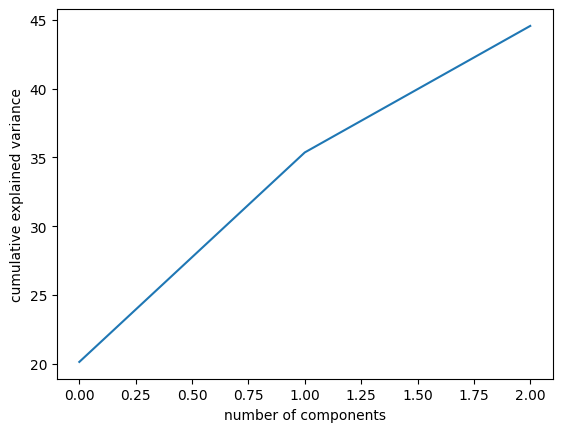

In [33]:
# support explained variance cumsum

explained_variance = pca3_sup.explained_variance_ratio_
explained_variance_cum = np.cumsum(explained_variance) * 100
plt.plot(explained_variance_cum)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()



In [34]:
# Support

n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
pred = kmeans.fit_predict(pca3_sup_df)

pred_str = [str(p) for p in pred]
px.scatter(pca3_sup_df, x='PC1', y='PC2', color=pred_str).show()
show_pca_correlation_circle(pca3_sup, sup_df, component_1 = 1, component_2 = 2)
px.scatter(pca3_sup_df, x='PC1', y='PC3', color=pred_str).show()
show_pca_correlation_circle(pca3_sup, sup_df, component_1 = 1, component_2 = 3)
px.scatter_3d(pca3_sup_df, x='PC1', y='PC2', z='PC3', color=pred_str).show()

# Cluster winrate

new_sup_df = deepcopy(sup_df)
new_sup_df['Cluster'] = pred
new_sup_df['Victory'] = df[df['Role'] == 'SUPPORT']['Victory']
print(new_sup_df.groupby('Cluster').mean()['Victory'] * 100)


Cluster
0    54.947368
1    83.700081
2    71.197411
3    23.315259
Name: Victory, dtype: float64


## Learning cluster predictor

In [35]:
#array_data = new_mid_df.drop(columns=['Cluster', 'Victory']).to_numpy()
array_data = pca3_mid_df.to_numpy()
array_clusters = new_mid_df['Cluster'].to_numpy()

x_train, x_test, y_train, y_test = train_test_split(array_data, array_clusters, test_size=0.2, random_state=42)

In [36]:
decision_tree = tree.DecisionTreeClassifier()
decision_tree.fit(x_train, y_train)

DecisionTreeClassifier()

In [37]:
decision_tree.decision_path(x_train)

<7588x587 sparse matrix of type '<class 'numpy.int64'>'
	with 72510 stored elements in Compressed Sparse Row format>

In [38]:
from IPython.display import Image
import os

figure_out = '../output/decision_tree_mid'
#feature_names = new_mid_df.drop(columns=['Cluster', 'Victory']).columns
feature_names = ['PC1', 'PC2', 'PC3']

dot_file = tree.export_graphviz(decision_tree, out_file=f'{figure_out}.dot',
                                feature_names=feature_names,
                                class_names=[f'Cluster {i}' for i in range(n_clusters)], filled=True)

os.system(f"dot -T png {figure_out}.dot -o {figure_out}.png")

Image(filename=figure_out+'.png')

In [39]:
print(cross_val_score(tree.DecisionTreeClassifier(), array_data, array_clusters, cv=5, n_jobs=-1).mean())

0.9500319677289802


In [40]:
print(cross_val_score(SVC(), array_data, array_clusters, cv=5, n_jobs=-1).mean())

0.9909342186903729


In [41]:
print(cross_val_score(RandomForestClassifier(), array_data, array_clusters, cv=5, n_jobs=-1).mean())

0.9714319042934522


In [42]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from scipy.stats import bartlett, shapiro

mid_df_pure_data = new_mid_df.drop(columns=['Cluster', 'Victory', 'LVLD@15'])

for column in mid_df_pure_data.columns:

    column_by_clusters = []
    for i in range(n_clusters):
        column_by_clusters.append(mid_df_pure_data[new_mid_df['Cluster'] == i][column].to_numpy())

    bartlett_p_value = bartlett(*column_by_clusters).pvalue

    if not(bartlett_p_value >= 0.05 or np.isclose(bartlett_p_value, 0.05, atol=0.002)):
        print('p value of bartlett less than 0.05, ANOVA not applicable')
        continue

    shapiro_p_values = shapiro(df[column]).pvalue

    if not(bartlett_p_value >= 0.05 or np.isclose(bartlett_p_value, 0.05, atol=0.002)):
        print('p value of shapiro less than 0.05, ANOVA not applicable')
        continue
    
    formula = f"{column} ~ C(Cluster)"
    
    anova_result = ols(formula=formula, data=mid_df).fit()
    print(anova_lm(anova_result))

ModuleNotFoundError: No module named 'statsmodels'